In [1]:
import scanpy as sc

sc.set_figure_params(figsize=(4, 4))

In [2]:
adata = sc.read_h5ad("../../data/30_merge_adata/adata_scvi.h5ad")

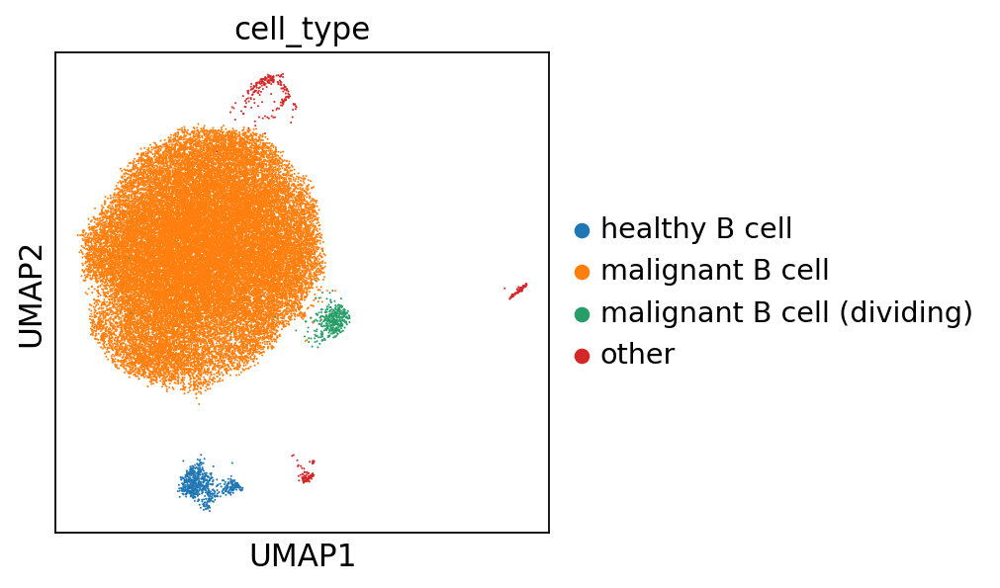

In [3]:
sc.pl.umap(adata, color="cell_type")

In [4]:
adata = adata[adata.obs["cell_type"] == "malignant B cell", :]

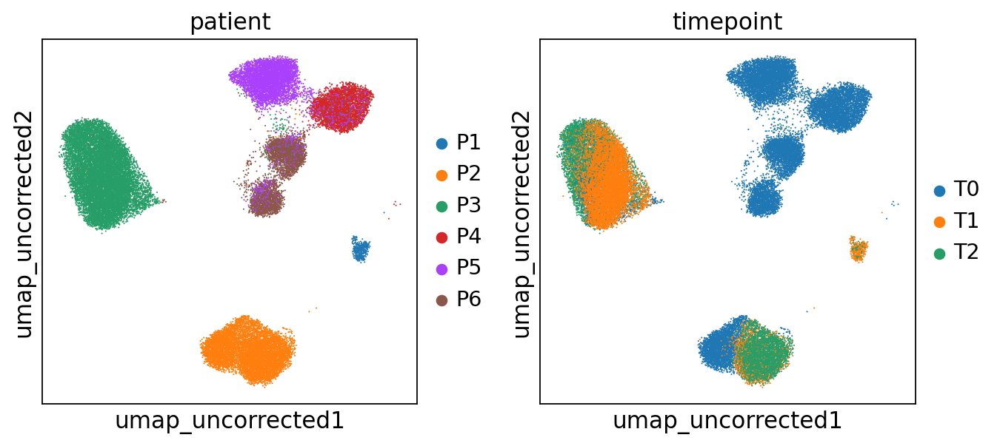

In [5]:
sc.pl.embedding(adata, "umap_uncorrected", color=["patient", "timepoint"])

P1


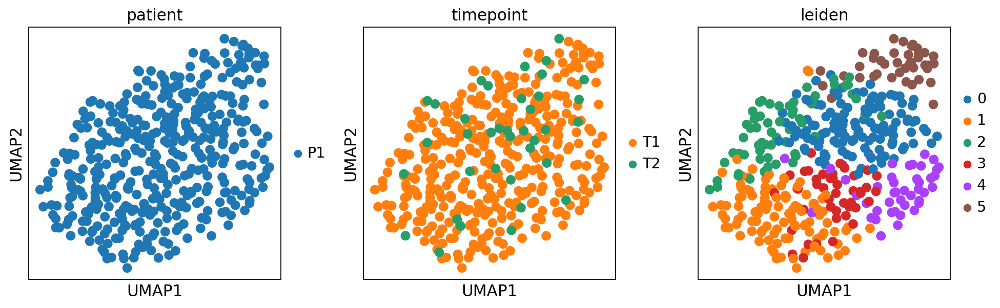

P2


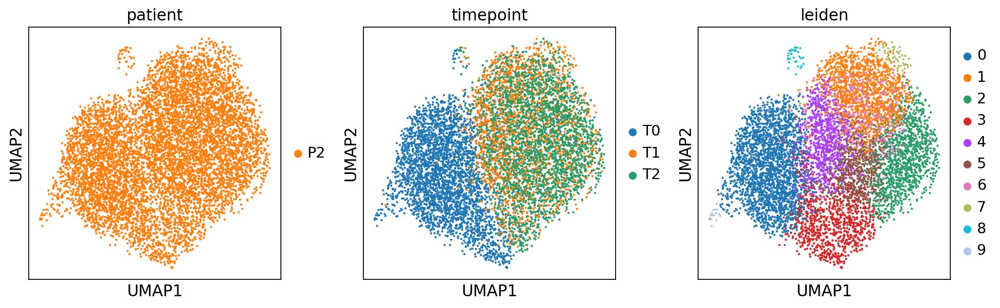

P3


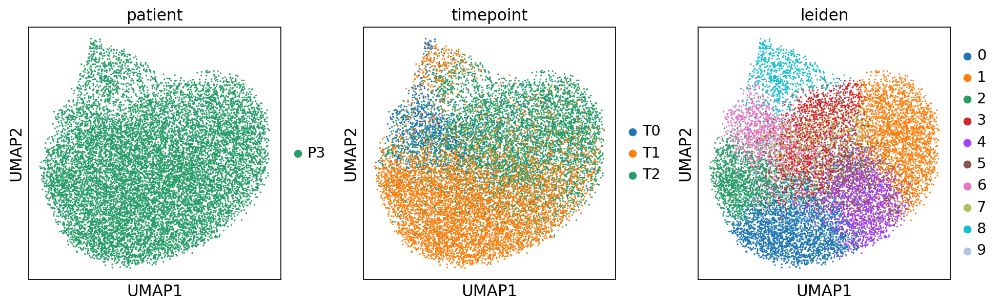

P4


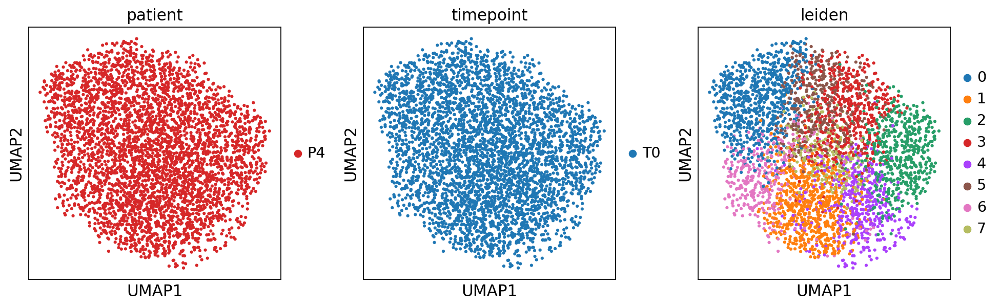

P5


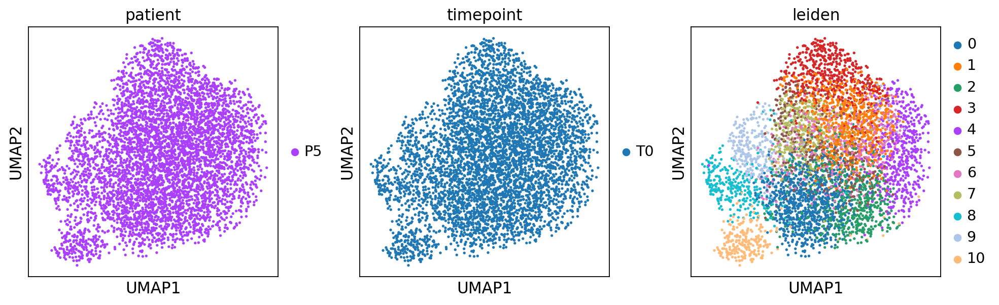

P6


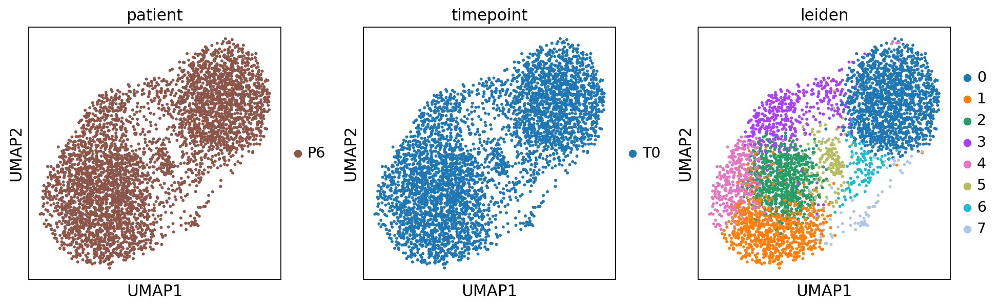

In [6]:
patient_adatas = dict()
# for patient in ["P1", "P2", "P3"]:
for patient in adata.obs["patient"].sort_values().unique():
    print(patient)
    tmp_adata = adata[adata.obs["patient"] == patient, :].copy()
    sc.tl.pca(tmp_adata)
    sc.pp.neighbors(tmp_adata)
    sc.tl.umap(tmp_adata)
    sc.tl.leiden(tmp_adata, resolution=1)
    sc.pl.umap(tmp_adata, color=["patient", "timepoint", "leiden"], ncols=4)
    patient_adatas[patient] = tmp_adata

In [7]:
for tmp_adata in patient_adatas.values():
    sc.tl.rank_genes_groups(tmp_adata, method="wilcoxon", groupby="leiden")

It appears that in all patients, there is a cluster that is FOSB+/JUN+/DUSP1+.

P1


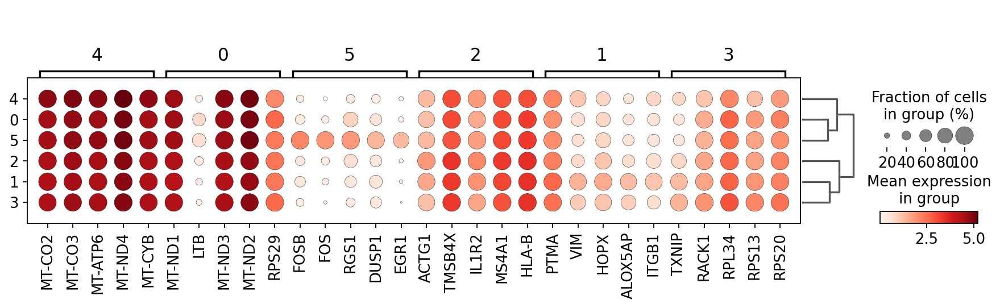

P2


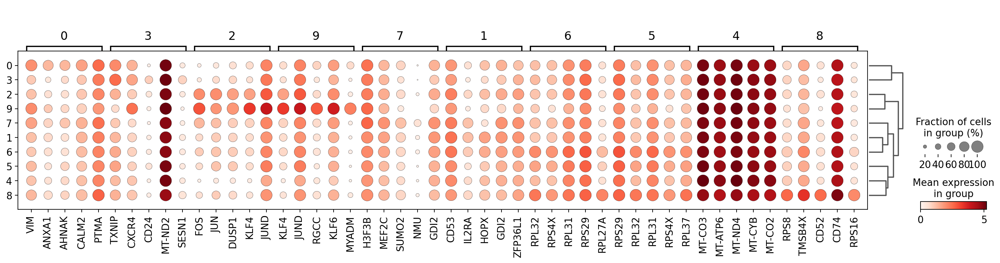

P3


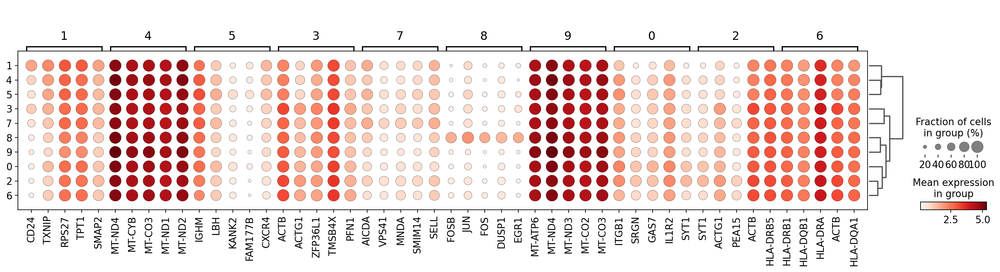

P4


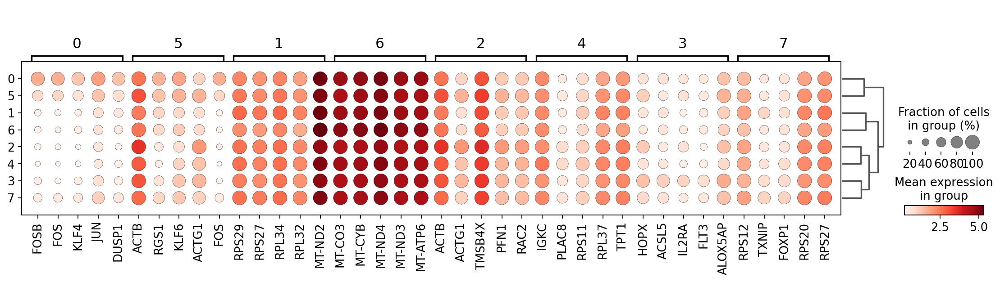

P5


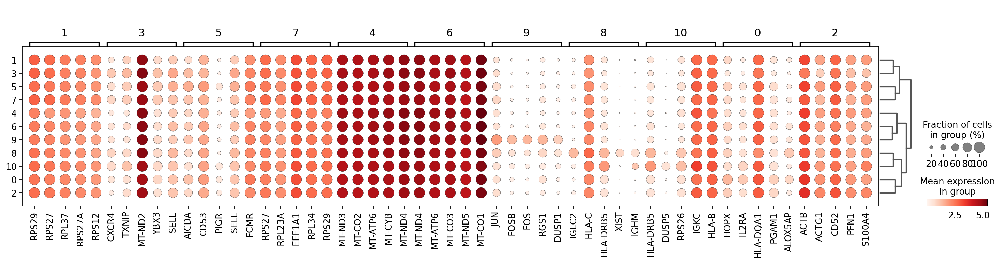

P6


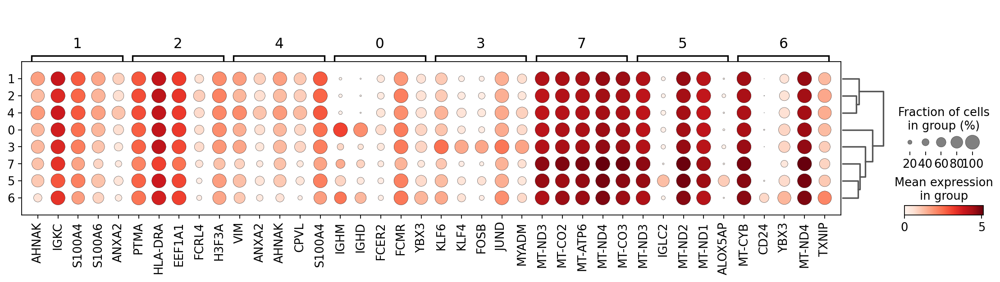

In [8]:
for tmp_patient, tmp_adata in patient_adatas.items():
    print(tmp_patient)
    sc.pl.rank_genes_groups_dotplot(tmp_adata, n_genes=5)

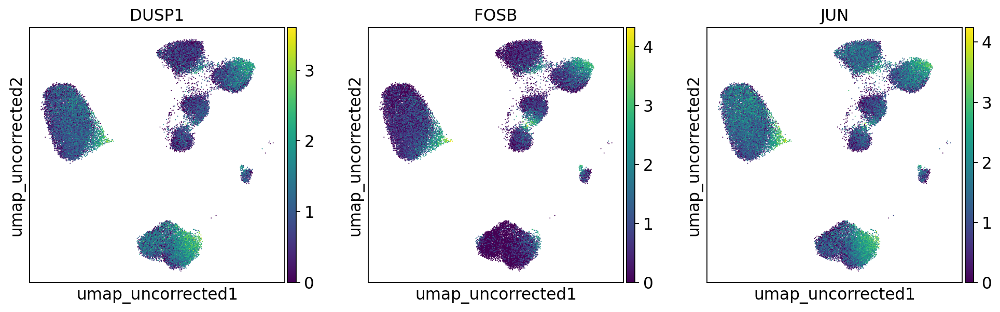

In [9]:
sc.pl.embedding(adata, "umap_uncorrected", color=["DUSP1", "FOSB", "JUN"])

P1


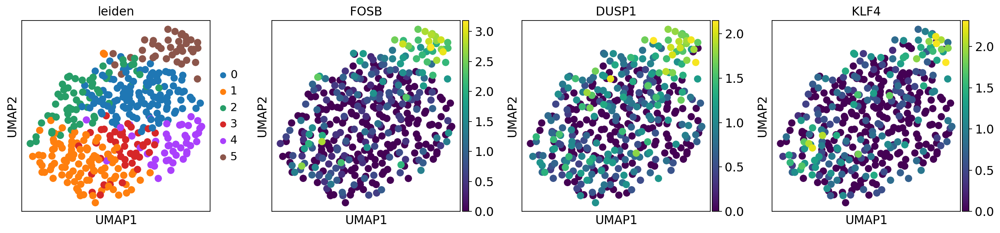

P2


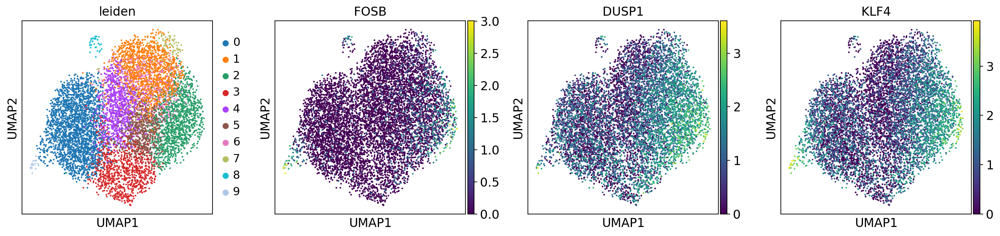

P3


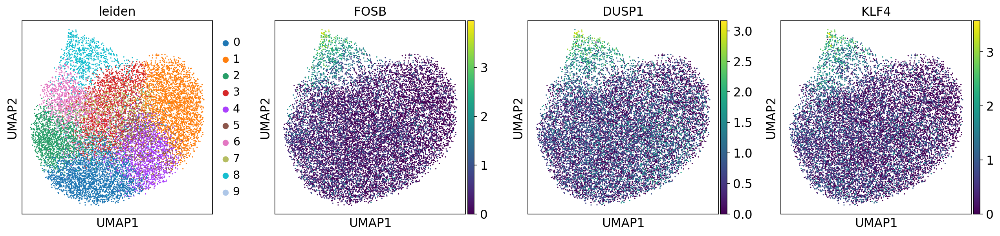

P4


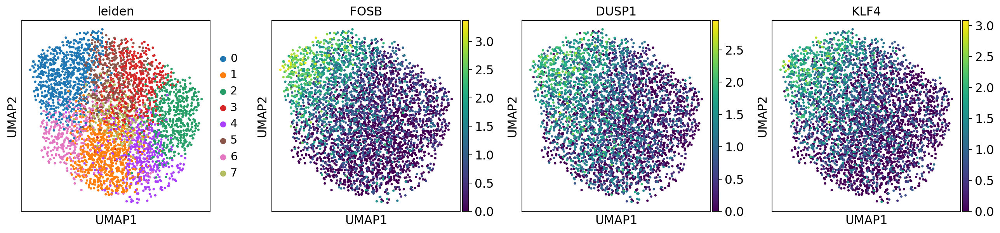

P5


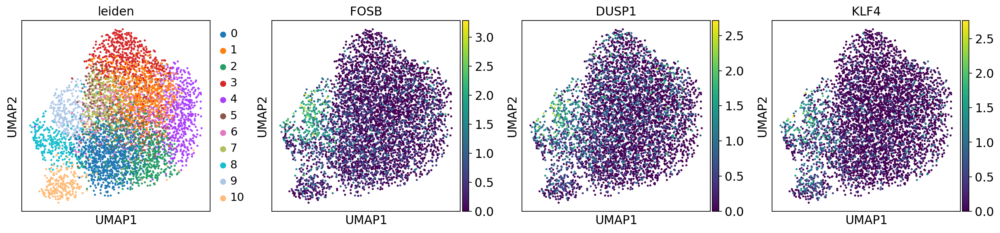

P6


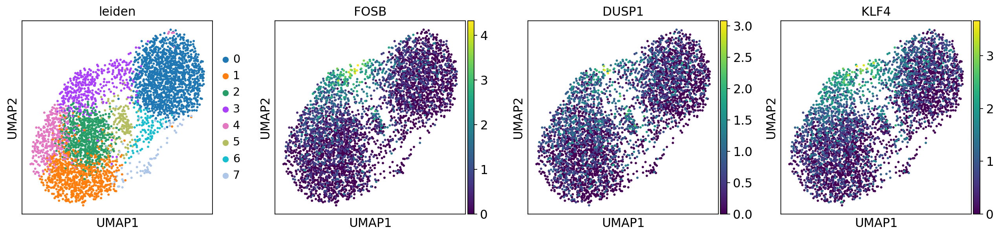

In [10]:
for tmp_patient, tmp_adata in patient_adatas.items():
    print(tmp_patient)
    sc.pl.umap(tmp_adata, color=["leiden", "FOSB", "DUSP1", "KLF4"])

In [11]:
# for each patient, the clusters that are FOS+ JUN+
fos_annotation = {"P1": [5], "P2": [9, 2], "P3": [8], "P4": [0], "P5": [9], "P6": [3]}

In [16]:
adata.obs["cell_phenotype"] = "malignant_b"
for tmp_patient, tmp_adata in patient_adatas.items():
    adata.obs.loc[
        tmp_adata[
            tmp_adata.obs["leiden"].isin([str(x) for x in fos_annotation[tmp_patient]])
        ].obs_names,
        "cell_phenotype",
    ] = "fos_malignant_b"

... storing 'cell_phenotype' as categorical


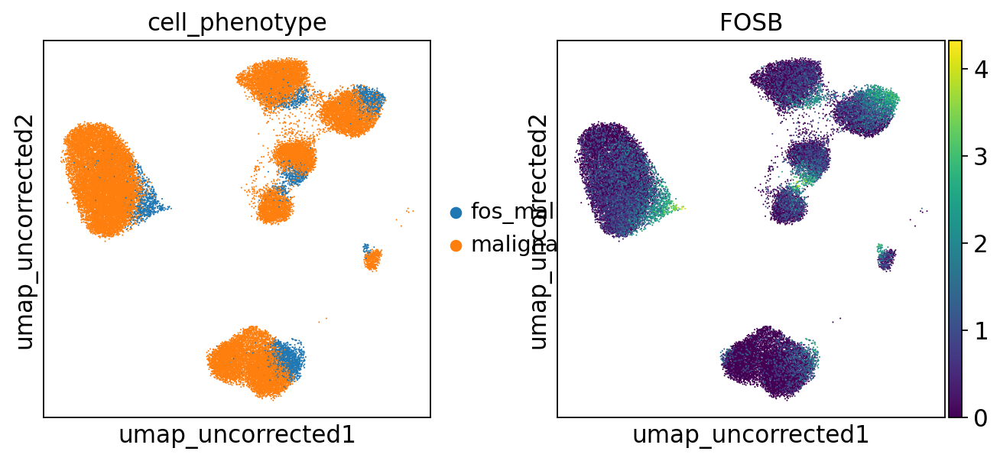

In [17]:
sc.pl.embedding(adata, "umap_uncorrected", color=["cell_phenotype", "FOSB"])

In [14]:
adata.write_h5ad("../../data/60_cluster_analysis/adata_malignant_b_cells.h5ad")

## Plot cluster abundance by timepoint

In [ ]:
for patient in ["P1", "P2", "P3"]

In [15]:
patient = "P1"